In [1]:
# Importing the drive module from google.colab library
from google.colab import drive

# Mounting the Google Drive to the Colab environment
drive.mount('/content/drive')

project_path = '/content/drive/My Drive/MSc_Thesis/'

import os
os.chdir(project_path)

Mounted at /content/drive


In [2]:
import numpy as np
from utils.helpers_functions import denormalize_mae, read_dataset,mean_with_land_mask, mean_with_coastline_mask
from utils.display_functions import plot_to_compare, plot_history, plot_per_pixel_metrics, plot_degrees_mae, plot_mask_grid
from utils.models_functions import psnr, ssim, load_model, save_model, train_model
from utils.evaluation_functions import evaluate_per_pixel

dates_path='input_data/index/'
lr_data_path='input_data/deg/1x1/'
hr_data_path='input_data/deg/0_5x0_5/'
global_mean = 286.307980744908
global_Std = 64.2568020375484
target_size = (160, 290)

In [3]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Add, LeakyReLU, Lambda, Conv2DTranspose, UpSampling2D
from tensorflow.keras.models import Model

# Residual Block (Keeping Filters Constant)
def residual_block(x, filters=32, kernel_size=3, scaling=0.1):
    res = Conv2D(filters, kernel_size, padding='same')(x)
    res = LeakyReLU(alpha=0.2)(res)
    res = Conv2D(filters, kernel_size, padding='same')(res)
    res = Lambda(lambda t: t * scaling)(res)  # Scale residual output
    return Add()([x, res])  # Skip connection within residual block

def create_edsr():
    input_img = Input(shape=(80, 145, 1))  # Low-resolution input

    # Initial Conv Layer
    initial_conv = Conv2D(filters=32, kernel_size=3, padding='same')(input_img)
    # x = LeakyReLU(alpha=0.2)(x)

    # Residual Blocks (Feature Extraction)
    x = residual_block(initial_conv, filters=32)
    x = residual_block(x, filters=32)
    x = residual_block(x, filters=32)
    x = residual_block(x, filters=32)

    x = Conv2D(filters=32, kernel_size=3, padding='same')(x)

    x = Add()([x, initial_conv])

    # Upsampling Layer moved to the end
    x = UpSampling2D(size=(2, 2))(x)  # Upscale to (160, 290)

    # Final Conv Layer (Reduces to 1 Output Channel)
    output_img = Conv2D(filters=1, kernel_size=3, padding='same')(x)

    # Model Compilation
    model = Model(inputs=input_img, outputs=output_img)
    model.compile(optimizer='adam', loss='mae', metrics=[psnr, ssim, 'mse', 'mae'])

    return model

# **Spring**

In [4]:
trainX, valX, testX, trainY, valY, testY, trainDates, valDates, testDates = read_dataset(project_path, dates_path, lr_data_path, hr_data_path, \
                                                                                         'spring', 2000, 2020, global_mean, global_Std)

print(trainX.shape)
print(trainY.shape)
print(valX.shape)
print(valY.shape)

(5409, 80, 145, 1)
(5409, 160, 290, 1)
(1159, 80, 145, 1)
(1159, 160, 290, 1)


In [5]:
# Initialize the model
spring_edsr_model = create_edsr()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Epoch 1/1000
43/43 ━━━━━━━━━━━━━━━━━━━━ 24s 214ms/step - loss: 0.0573 - mae: 0.0573 - mse: 0.0085 - psnr: 23.5366 - ssim: 0.7954 - val_loss: 0.0130 - val_mae: 0.0130 - val_mse: 0.0010 - val_psnr: 29.8560 - val_ssim: 0.9320 - learning_rate: 0.0010
Epoch 2/1000
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0119 - mae: 0.0119 - mse: 8.1336e-04 - psnr: 31.0003 - ssim: 0.9377 - val_loss: 0.0087 - val_mae: 0.0087 - val_mse: 3.9254e-04 - val_psnr: 34.0046 - val_ssim: 0.9501 - learning_rate: 0.0010
Epoch 3/1000
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.0084 - mae: 0.0084 - mse: 3.5830e-04 - psnr: 34.4697 - ssim: 0.9519 - val_loss: 0.0082 - val_mae: 0.0082 - val_mse: 2.9573e-04 - val_psnr: 35.2444 - val_ssim: 0.9553 - learning_rate: 0.0010
Epoch 4/1000
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.0079 - mae: 0.0079 - mse: 2.8293e-04 - psnr: 35.4874 - ssim: 0.9556 - val_loss: 0.0076 - val_mae: 0.0076 - val_mse: 2.4962e-04 - val_psnr: 35.9835 - val_ssim: 0.9568 - learning_rate: 0

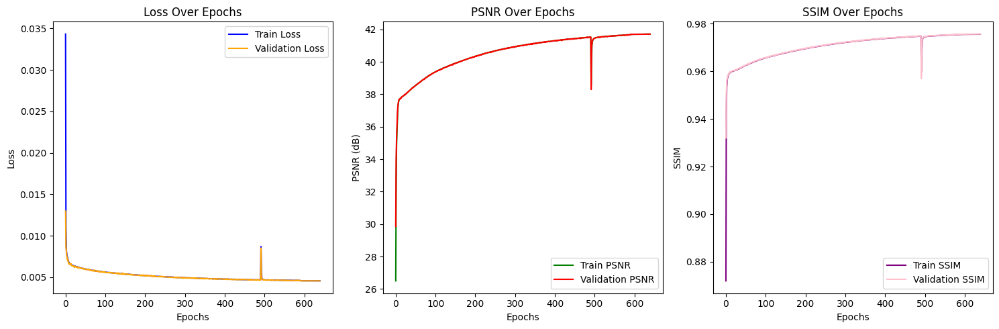

In [6]:
history = train_model(spring_edsr_model, trainX, trainY, valX, valY, 1000, 128, True, True, 150, 100)
plot_history(history)
save_model(spring_edsr_model, 'models/edsr_model_1to0_5_deg_spring.keras')

In [ ]:
# spring_edsr_model = tf.keras.models.load_model('models/edsr_model_1to0_5_deg_spring.keras', custom_objects={'psnr': psnr, 'ssim': ssim}, safe_mode=False)

In [7]:
test_loss, test_psnr, test_ssim, test_mse, test_mae = spring_edsr_model.evaluate(testX, testY)

print(f"Test Loss: {test_loss}")
print(f"Test PSNR: {test_psnr}")
print(f"Test SSIM: {test_ssim}")
print(f"Test MSE: {test_mse}")
print(f"Test MAE: {test_mae}")

37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0046 - mae: 0.0046 - mse: 6.9827e-05 - psnr: 41.5613 - ssim: 0.9748
Test Loss: 0.00463875150308013
Test PSNR: 41.538047790527344
Test SSIM: 0.974712073802948
Test MSE: 7.015814480837435e-05
Test MAE: 0.00463875150308013


In [8]:
low_res_input = testX[1]
high_res_data = testY[1]
high_res_output = spring_edsr_model.predict(np.expand_dims(low_res_input, axis=0))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


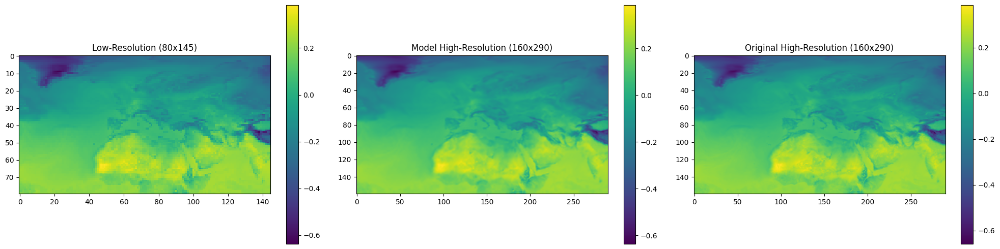

In [9]:
plot_to_compare(low_res_input, np.squeeze(high_res_data),  np.squeeze(high_res_output), 'viridis')

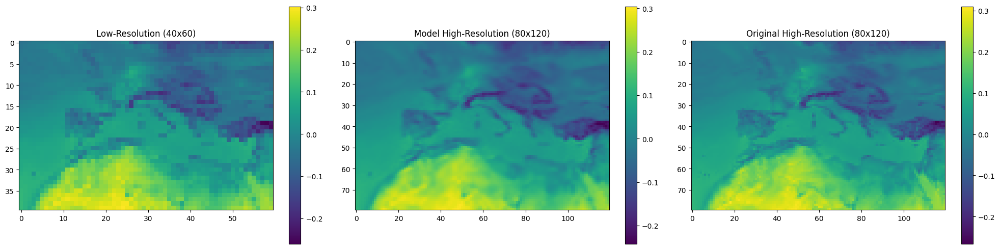

In [10]:
plot_to_compare(low_res_input[20:60, 40:100], np.squeeze(high_res_data)[40:120, 80:200],  np.squeeze(high_res_output)[40:120, 80:200], 'viridis')

In [11]:
# Compute per-pixel metrics
test_mse, test_mae, test_psnr, test_ssim = evaluate_per_pixel(spring_edsr_model, testX, testY)

mean_mse = np.mean(test_mse)
mean_mae = np.mean(test_mae)
mean_psnr = np.mean(test_psnr)
mean_ssim = np.mean(test_ssim)

print("Mean Per-Pixel MSE:", mean_mse)
print("Mean Per-Pixel MAE:", mean_mae)
print("Mean Per-Pixel PSNR:", mean_psnr)
print("Mean Per-Pixel SSIM:", mean_ssim)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Mean Per-Pixel MSE: 7.015815e-05
Mean Per-Pixel MAE: 0.004638752
Mean Per-Pixel PSNR: 47.062275
Mean Per-Pixel SSIM: 0.9891145


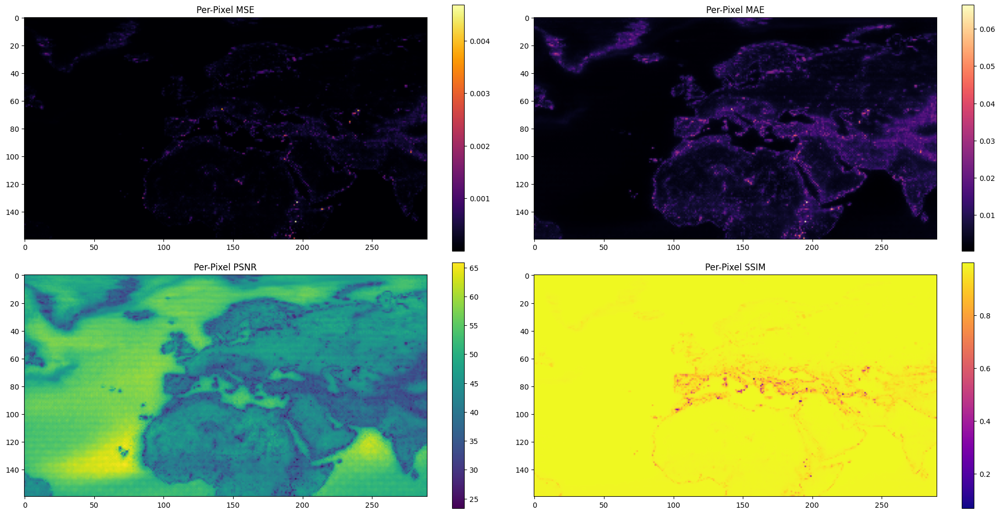

In [12]:
# Plot results
plot_per_pixel_metrics(test_mse, test_mae, test_psnr, test_ssim)

Mean Per-Pixel Degrees MAE: 0.29807138
Max Degrees MAE: 4.265519
Min Degrees MAE: 0.02377056


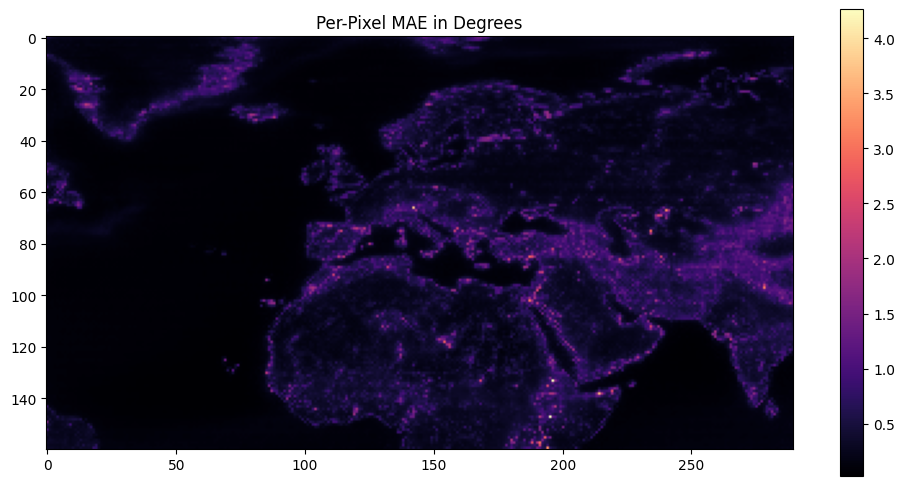

In [13]:
degrees_mae = denormalize_mae(test_mae, global_Std)
print("Mean Per-Pixel Degrees MAE:", np.mean(degrees_mae))
print("Max Degrees MAE:", degrees_mae.max())
print("Min Degrees MAE:", degrees_mae.min())
plot_degrees_mae(degrees_mae)

In [14]:
print("Mean Land-Pixels Degrees MAE:", mean_with_land_mask(degrees_mae, '0_5'))
print("Mean Land-Pixels MAE:", mean_with_land_mask(test_mae, '0_5'))

Mean Land-Pixels Degrees MAE: 0.45378426
Mean Land-Pixels MAE: 0.0070620426


In [15]:
print("Mean Coastline-Pixels Degrees MAE:", mean_with_coastline_mask(degrees_mae, '0_5'))
print("Mean Costline-Pixels MAE:", mean_with_coastline_mask(test_mae, '0_5'))

Mean Coastline-Pixels Degrees MAE: 0.6592538
Mean Costline-Pixels MAE: 0.010259672


# **Summer**

In [17]:
trainX, valX, testX, trainY, valY, testY, trainDates, valDates, testDates = read_dataset(project_path, dates_path, lr_data_path, hr_data_path, \
                                                                                         'summer', 2000, 2020, global_mean, global_Std)

print(trainX.shape)
print(trainY.shape)
print(valX.shape)
print(valY.shape)

(5409, 80, 145, 1)
(5409, 160, 290, 1)
(1159, 80, 145, 1)
(1159, 160, 290, 1)


In [18]:
# Initialize the model
summer_edsr_model = create_edsr()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Epoch 1/1000
43/43 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0319 - mae: 0.0319 - mse: 0.0027 - psnr: 28.0505 - ssim: 0.8124 - val_loss: 0.0092 - val_mae: 0.0092 - val_mse: 3.5412e-04 - val_psnr: 34.4732 - val_ssim: 0.9458 - learning_rate: 0.0010
Epoch 2/1000
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0085 - mae: 0.0085 - mse: 3.1380e-04 - psnr: 35.0535 - ssim: 0.9492 - val_loss: 0.0074 - val_mae: 0.0074 - val_mse: 2.4909e-04 - val_psnr: 36.0027 - val_ssim: 0.9556 - learning_rate: 0.0010
Epoch 3/1000
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0075 - mae: 0.0075 - mse: 2.4387e-04 - psnr: 36.1302 - ssim: 0.9564 - val_loss: 0.0072 - val_mae: 0.0072 - val_mse: 2.2327e-04 - val_psnr: 36.4769 - val_ssim: 0.9581 - learning_rate: 0.0010
Epoch 4/1000
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0072 - mae: 0.0072 - mse: 2.1920e-04 - psnr: 36.5926 - ssim: 0.9584 - val_loss: 0.0071 - val_mae: 0.0071 - val_mse: 2.0492e-04 - val_psnr: 36.8482 - val_ssim: 0.9592 - learning_rat

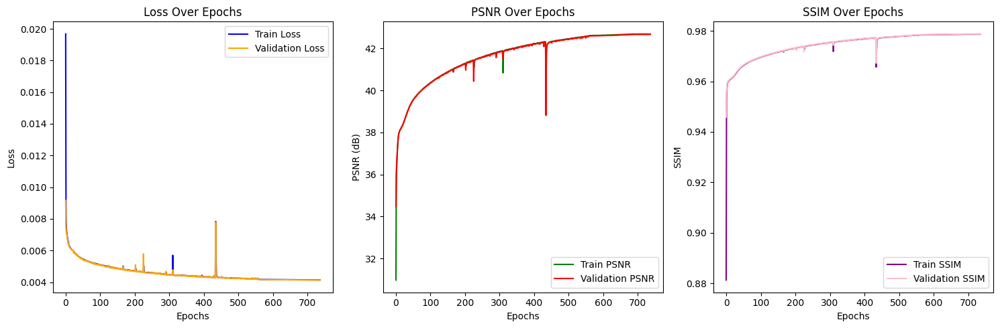

In [19]:
history = train_model(summer_edsr_model, trainX, trainY, valX, valY, 1000, 128, True, True, 150, 100)
plot_history(history)
save_model(summer_edsr_model, 'models/edsr_model_1to0_5_deg_summer.keras')

In [ ]:
# summer_edsr_model = tf.keras.models.load_model('models/edsr_model_1to0_5_deg_summer.keras', custom_objects={'psnr': psnr, 'ssim': ssim}, safe_mode=False)

In [20]:
test_loss, test_psnr, test_ssim, test_mse, test_mae = summer_edsr_model.evaluate(testX, testY)

print(f"Test Loss: {test_loss}")
print(f"Test PSNR: {test_psnr}")
print(f"Test SSIM: {test_ssim}")
print(f"Test MSE: {test_mse}")
print(f"Test MAE: {test_mae}")

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0041 - mae: 0.0041 - mse: 5.3939e-05 - psnr: 42.6829 - ssim: 0.9786
Test Loss: 0.0041658589616417885
Test PSNR: 42.629432678222656
Test SSIM: 0.9784377813339233
Test MSE: 5.454559868667275e-05
Test MAE: 0.0041658589616417885


In [21]:
low_res_input = testX[1]
high_res_data = testY[1]
high_res_output = summer_edsr_model.predict(np.expand_dims(low_res_input, axis=0))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


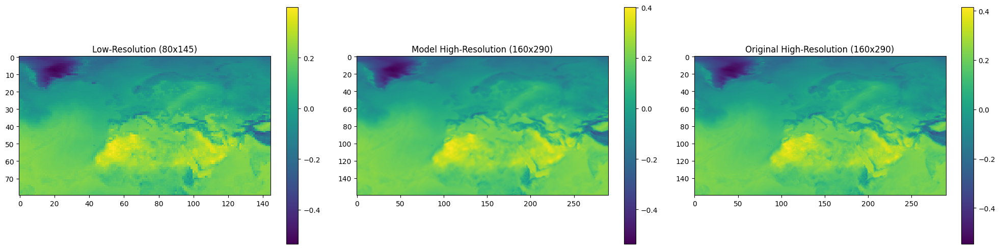

In [22]:
plot_to_compare(low_res_input, np.squeeze(high_res_data),  np.squeeze(high_res_output), 'viridis')

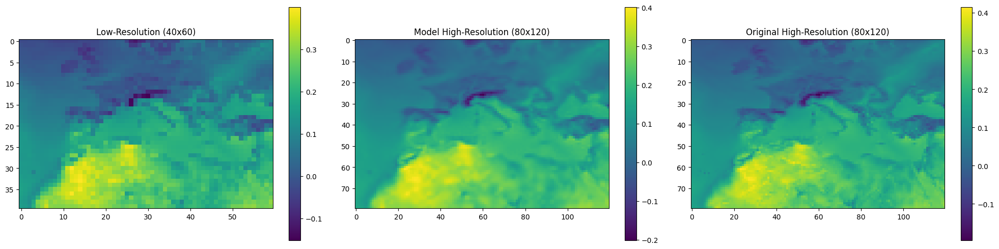

In [23]:
plot_to_compare(low_res_input[20:60, 40:100], np.squeeze(high_res_data)[40:120, 80:200],  np.squeeze(high_res_output)[40:120, 80:200], 'viridis')

In [24]:
# Compute per-pixel metrics
test_mse, test_mae, test_psnr, test_ssim = evaluate_per_pixel(summer_edsr_model, testX, testY)

mean_mse = np.mean(test_mse)
mean_mae = np.mean(test_mae)
mean_psnr = np.mean(test_psnr)
mean_ssim = np.mean(test_ssim)

print("Mean Per-Pixel MSE:", mean_mse)
print("Mean Per-Pixel MAE:", mean_mae)
print("Mean Per-Pixel PSNR:", mean_psnr)
print("Mean Per-Pixel SSIM:", mean_ssim)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Mean Per-Pixel MSE: 5.4545588e-05
Mean Per-Pixel MAE: 0.0041658594
Mean Per-Pixel PSNR: 48.03555
Mean Per-Pixel SSIM: 0.98864025


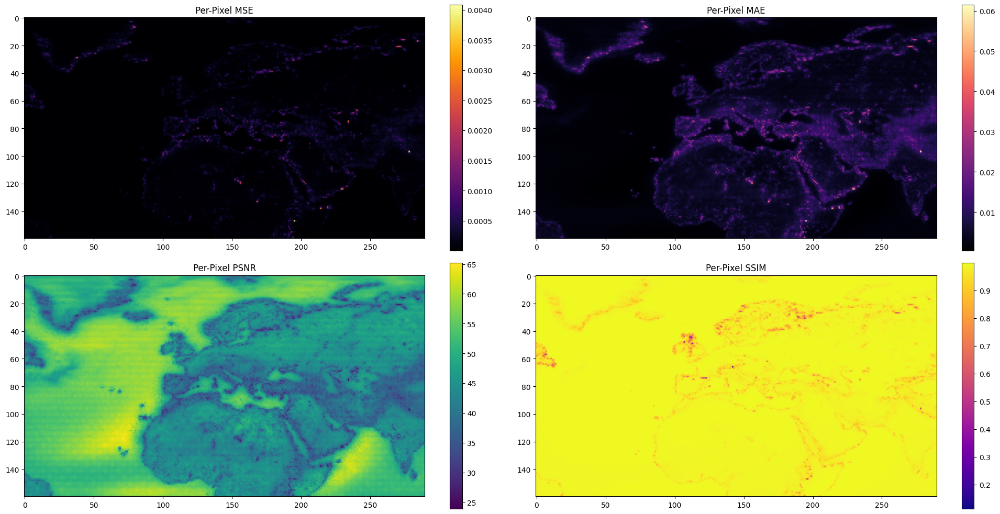

In [25]:
# Plot results
plot_per_pixel_metrics(test_mse, test_mae, test_psnr, test_ssim)

Mean Per-Pixel Degrees MAE: 0.26768482
Max Degrees MAE: 3.9513757
Min Degrees MAE: 0.026623417


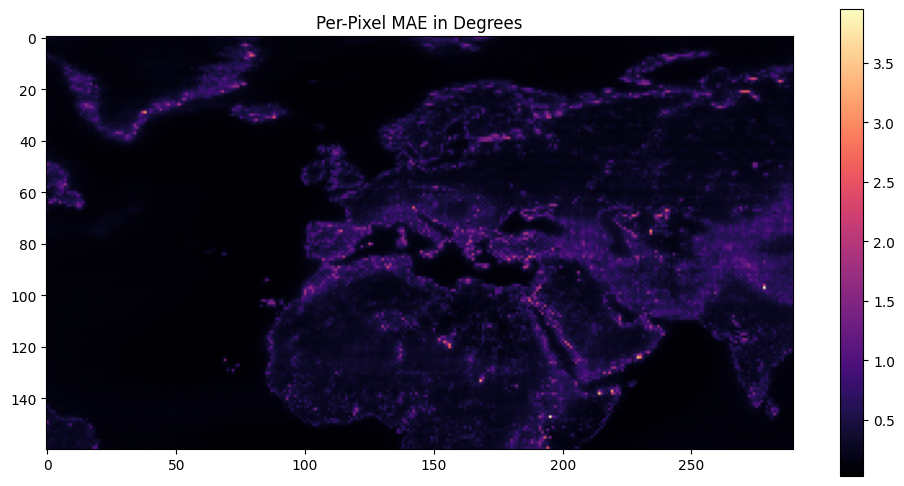

In [26]:
degrees_mae = denormalize_mae(test_mae, global_Std)
print("Mean Per-Pixel Degrees MAE:", np.mean(degrees_mae))
print("Max Degrees MAE:", degrees_mae.max())
print("Min Degrees MAE:", degrees_mae.min())
plot_degrees_mae(degrees_mae)

In [27]:
print("Mean Land-Pixels Degrees MAE:", mean_with_land_mask(degrees_mae, '0_5'))
print("Mean Land-Pixels MAE:", mean_with_land_mask(test_mae, '0_5'))

Mean Land-Pixels Degrees MAE: 0.39857402
Mean Land-Pixels MAE: 0.0062028295


In [28]:
print("Mean Coastline-Pixels Degrees MAE:", mean_with_coastline_mask(degrees_mae, '0_5'))
print("Mean Costline-Pixels MAE:", mean_with_coastline_mask(test_mae, '0_5'))

Mean Coastline-Pixels Degrees MAE: 0.6339368
Mean Costline-Pixels MAE: 0.009865676


# **Autumn**

In [4]:
trainX, valX, testX, trainY, valY, testY, trainDates, valDates, testDates = read_dataset(project_path, dates_path, lr_data_path, hr_data_path, \
                                                                                         'autumn', 2000, 2020, global_mean, global_Std)

print(trainX.shape)
print(trainY.shape)
print(valX.shape)
print(valY.shape)

(5350, 80, 145, 1)
(5350, 160, 290, 1)
(1146, 80, 145, 1)
(1146, 160, 290, 1)


In [5]:
# Initialize the model
autumn_edsr_model = create_edsr()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Epoch 1/1000
42/42 ━━━━━━━━━━━━━━━━━━━━ 29s 361ms/step - loss: 0.0627 - mae: 0.0627 - mse: 0.0106 - psnr: 23.5021 - ssim: 0.7272 - val_loss: 0.0116 - val_mae: 0.0116 - val_mse: 7.6729e-04 - val_psnr: 31.1530 - val_ssim: 0.9292 - learning_rate: 0.0010
Epoch 2/1000
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0110 - mae: 0.0110 - mse: 6.2639e-04 - psnr: 32.1247 - ssim: 0.9366 - val_loss: 0.0082 - val_mae: 0.0082 - val_mse: 3.0862e-04 - val_psnr: 35.1076 - val_ssim: 0.9512 - learning_rate: 0.0010
Epoch 3/1000
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0079 - mae: 0.0079 - mse: 2.7464e-04 - psnr: 35.6264 - ssim: 0.9532 - val_loss: 0.0073 - val_mae: 0.0073 - val_mse: 2.2935e-04 - val_psnr: 36.3962 - val_ssim: 0.9572 - learning_rate: 0.0010
Epoch 4/1000
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0074 - mae: 0.0074 - mse: 2.2594e-04 - psnr: 36.4629 - ssim: 0.9577 - val_loss: 0.0074 - val_mae: 0.0074 - val_mse: 2.0616e-04 - val_psnr: 36.8589 - val_ssim: 0.9594 - learning_rat

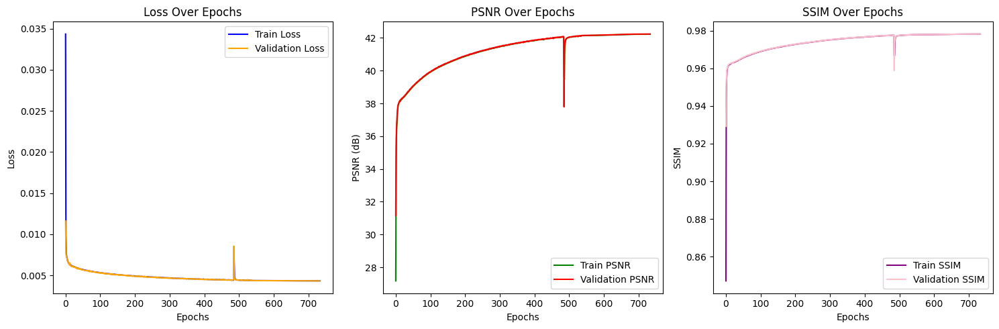

In [6]:
history = train_model(autumn_edsr_model, trainX, trainY, valX, valY, 1000, 128, True, True, 150, 100)
plot_history(history)
save_model(autumn_edsr_model, 'models/edsr_model_1to0_5_deg_autumn.keras')

In [ ]:
# autumn_edsr_model = tf.keras.models.load_model('models/edsr_model_1to0_5_deg_autumn.keras', custom_objects={'psnr': psnr, 'ssim': ssim}, safe_mode=False)

In [7]:
test_loss, test_psnr, test_ssim, test_mse, test_mae = autumn_edsr_model.evaluate(testX, testY)

print(f"Test Loss: {test_loss}")
print(f"Test PSNR: {test_psnr}")
print(f"Test SSIM: {test_ssim}")
print(f"Test MSE: {test_mse}")
print(f"Test MAE: {test_mae}")

36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0044 - mae: 0.0044 - mse: 6.0684e-05 - psnr: 42.1716 - ssim: 0.9779
Test Loss: 0.004365652333945036
Test PSNR: 42.15711212158203
Test SSIM: 0.9778191447257996
Test MSE: 6.088655209168792e-05
Test MAE: 0.004365652333945036


In [8]:
low_res_input = testX[1]
high_res_data = testY[1]
high_res_output = autumn_edsr_model.predict(np.expand_dims(low_res_input, axis=0))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


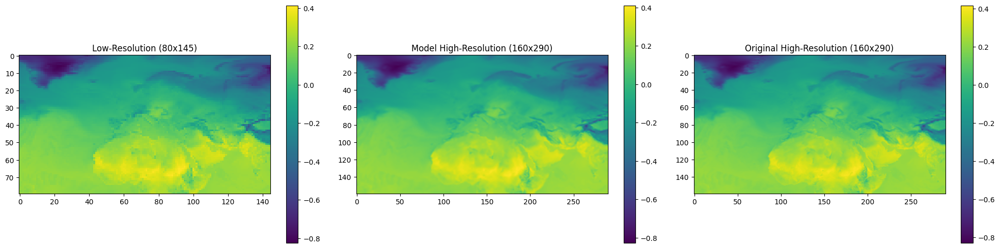

In [9]:
plot_to_compare(low_res_input, np.squeeze(high_res_data),  np.squeeze(high_res_output), 'viridis')

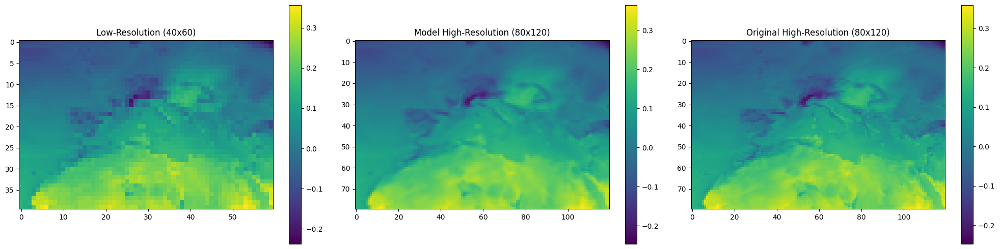

In [10]:
plot_to_compare(low_res_input[20:60, 40:100], np.squeeze(high_res_data)[40:120, 80:200],  np.squeeze(high_res_output)[40:120, 80:200], 'viridis')

In [11]:
# Compute per-pixel metrics
test_mse, test_mae, test_psnr, test_ssim = evaluate_per_pixel(autumn_edsr_model, testX, testY)

mean_mse = np.mean(test_mse)
mean_mae = np.mean(test_mae)
mean_psnr = np.mean(test_psnr)
mean_ssim = np.mean(test_ssim)

print("Mean Per-Pixel MSE:", mean_mse)
print("Mean Per-Pixel MAE:", mean_mae)
print("Mean Per-Pixel PSNR:", mean_psnr)
print("Mean Per-Pixel SSIM:", mean_ssim)

36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Mean Per-Pixel MSE: 6.0886545e-05
Mean Per-Pixel MAE: 0.004365652
Mean Per-Pixel PSNR: 47.25665
Mean Per-Pixel SSIM: 0.99042547


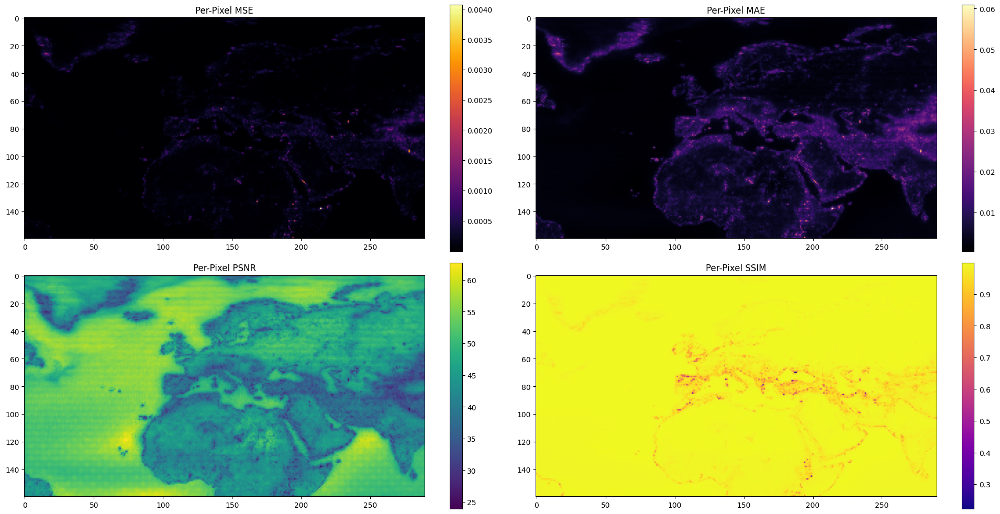

In [12]:
# Plot results
plot_per_pixel_metrics(test_mse, test_mae, test_psnr, test_ssim)

Mean Per-Pixel Degrees MAE: 0.28052288
Max Degrees MAE: 3.914997
Min Degrees MAE: 0.032282013


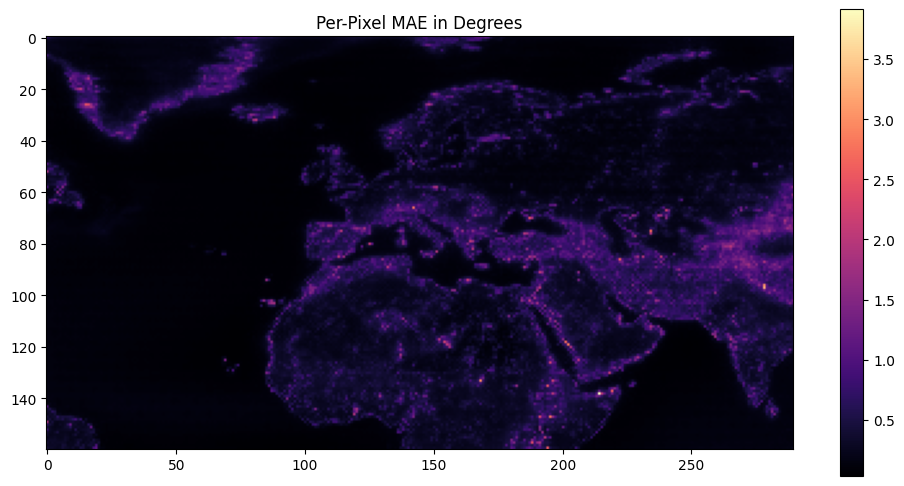

In [13]:
degrees_mae = denormalize_mae(test_mae, global_Std)
print("Mean Per-Pixel Degrees MAE:", np.mean(degrees_mae))
print("Max Degrees MAE:", degrees_mae.max())
print("Min Degrees MAE:", degrees_mae.min())
plot_degrees_mae(degrees_mae)

In [14]:
print("Mean Land-Pixels Degrees MAE:", mean_with_land_mask(degrees_mae, '0_5'))
print("Mean Land-Pixels MAE:", mean_with_land_mask(test_mae, '0_5'))

Mean Land-Pixels Degrees MAE: 0.42151502
Mean Land-Pixels MAE: 0.00655985


In [15]:
print("Mean Coastline-Pixels Degrees MAE:", mean_with_coastline_mask(degrees_mae, '0_5'))
print("Mean Costline-Pixels MAE:", mean_with_coastline_mask(test_mae, '0_5'))

Mean Coastline-Pixels Degrees MAE: 0.588902
Mean Costline-Pixels MAE: 0.009164819


# **Winter**

In [16]:
trainX, valX, testX, trainY, valY, testY, trainDates, valDates, testDates = read_dataset(project_path, dates_path, lr_data_path, hr_data_path, \
                                                                                         'winter', 2000, 2020, global_mean, global_Std)

print(trainX.shape)
print(trainY.shape)
print(valX.shape)
print(valY.shape)

(5308, 80, 145, 1)
(5308, 160, 290, 1)
(1137, 80, 145, 1)
(1137, 160, 290, 1)


In [17]:
# Initialize the model
winter_edsr_model = create_edsr()

Epoch 1/1000
42/42 ━━━━━━━━━━━━━━━━━━━━ 18s 296ms/step - loss: 0.0726 - mae: 0.0726 - mse: 0.0181 - psnr: 22.8863 - ssim: 0.7016 - val_loss: 0.0131 - val_mae: 0.0131 - val_mse: 7.8838e-04 - val_psnr: 31.0323 - val_ssim: 0.9343 - learning_rate: 0.0010
Epoch 2/1000
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.0116 - mae: 0.0116 - mse: 6.6499e-04 - psnr: 31.8428 - ssim: 0.9414 - val_loss: 0.0086 - val_mae: 0.0086 - val_mse: 3.7000e-04 - val_psnr: 34.3175 - val_ssim: 0.9536 - learning_rate: 0.0010
Epoch 3/1000
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0084 - mae: 0.0084 - mse: 3.3642e-04 - psnr: 34.7453 - ssim: 0.9550 - val_loss: 0.0079 - val_mae: 0.0079 - val_mse: 2.6516e-04 - val_psnr: 35.7645 - val_ssim: 0.9575 - learning_rate: 0.0010
Epoch 4/1000
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.0079 - mae: 0.0079 - mse: 2.4975e-04 - psnr: 36.0305 - ssim: 0.9580 - val_loss: 0.0076 - val_mae: 0.0076 - val_mse: 2.1872e-04 - val_psnr: 36.6009 - val_ssim: 0.9590 - learning_rat

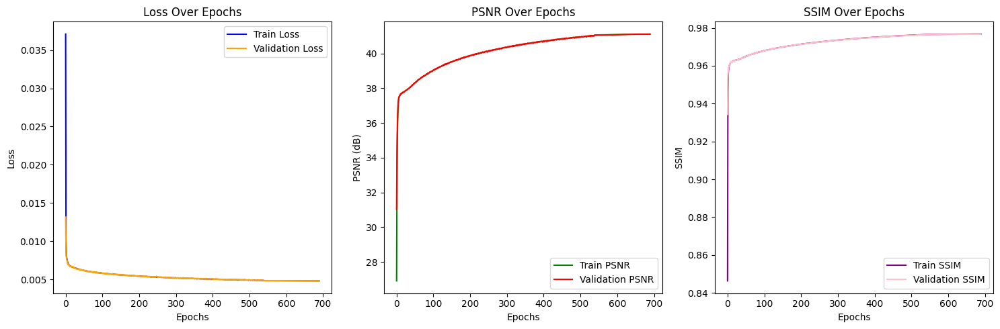

In [18]:
history = train_model(winter_edsr_model, trainX, trainY, valX, valY, 1000, 128, True, True, 150, 100)
plot_history(history)
save_model(winter_edsr_model, 'models/edsr_model_1to0_5_deg_winter.keras')

In [ ]:
# winter_edsr_model = tf.keras.models.load_model('models/edsr_model_1to0_5_deg_winter.keras', custom_objects={'psnr': psnr, 'ssim': ssim}, safe_mode=False)

In [19]:
test_loss, test_psnr, test_ssim, test_mse, test_mae = winter_edsr_model.evaluate(testX, testY)

print(f"Test Loss: {test_loss}")
print(f"Test PSNR: {test_psnr}")
print(f"Test SSIM: {test_ssim}")
print(f"Test MSE: {test_mse}")
print(f"Test MAE: {test_mae}")

36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0048 - mae: 0.0048 - mse: 7.7980e-05 - psnr: 41.0816 - ssim: 0.9766
Test Loss: 0.004824700299650431
Test PSNR: 41.060142517089844
Test SSIM: 0.9764770865440369
Test MSE: 7.838849705876783e-05
Test MAE: 0.004824700299650431


In [20]:
low_res_input = testX[1]
high_res_data = testY[1]
high_res_output = winter_edsr_model.predict(np.expand_dims(low_res_input, axis=0))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


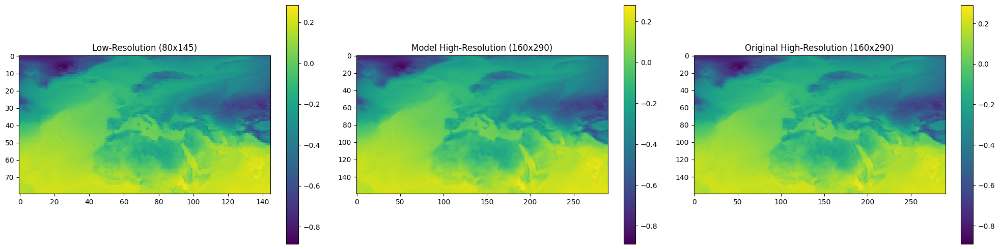

In [21]:
plot_to_compare(low_res_input, np.squeeze(high_res_data),  np.squeeze(high_res_output), 'viridis')

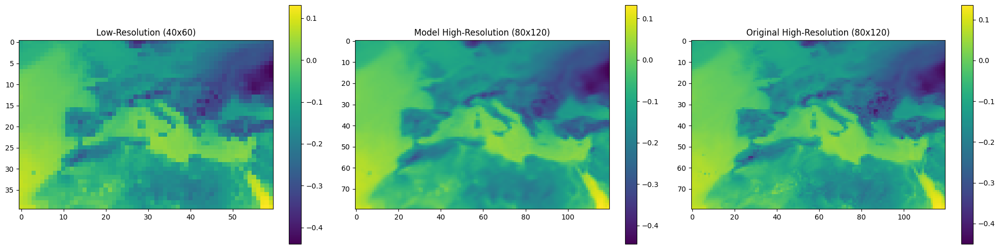

In [22]:
plot_to_compare(low_res_input[20:60, 40:100], np.squeeze(high_res_data)[40:120, 80:200],  np.squeeze(high_res_output)[40:120, 80:200], 'viridis')

In [23]:
# Compute per-pixel metrics
test_mse, test_mae, test_psnr, test_ssim = evaluate_per_pixel(winter_edsr_model, testX, testY)

mean_mse = np.mean(test_mse)
mean_mae = np.mean(test_mae)
mean_psnr = np.mean(test_psnr)
mean_ssim = np.mean(test_ssim)

print("Mean Per-Pixel MSE:", mean_mse)
print("Mean Per-Pixel MAE:", mean_mae)
print("Mean Per-Pixel PSNR:", mean_psnr)
print("Mean Per-Pixel SSIM:", mean_ssim)

36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
Mean Per-Pixel MSE: 7.838851e-05
Mean Per-Pixel MAE: 0.0048246994
Mean Per-Pixel PSNR: 46.721535
Mean Per-Pixel SSIM: 0.98900694


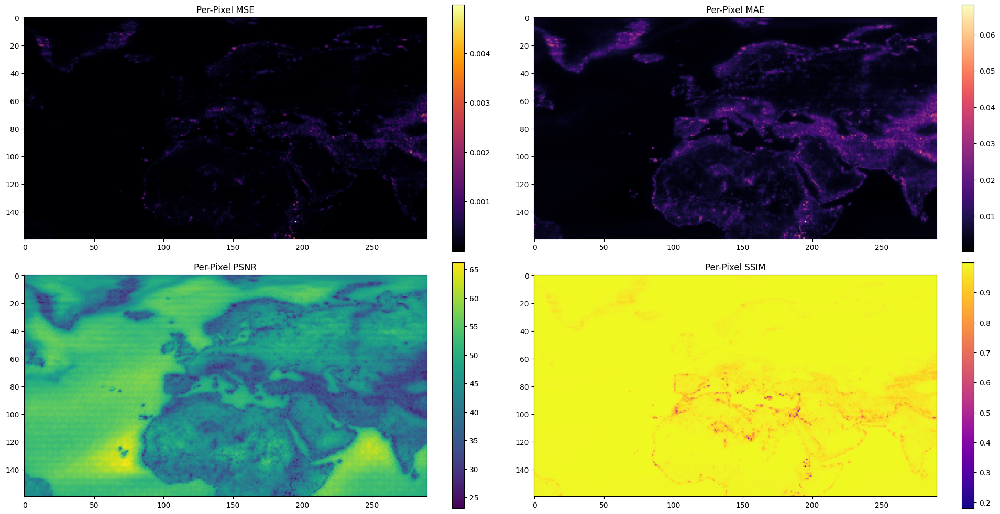

In [24]:
# Plot results
plot_per_pixel_metrics(test_mse, test_mae, test_psnr, test_ssim)

Mean Per-Pixel Degrees MAE: 0.3100198
Max Degrees MAE: 4.3760667
Min Degrees MAE: 0.022443134


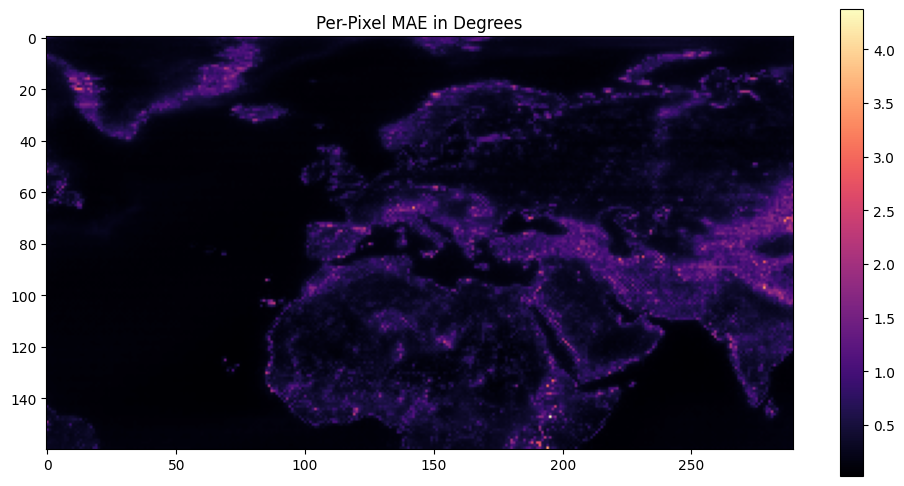

In [25]:
degrees_mae = denormalize_mae(test_mae, global_Std)
print("Mean Per-Pixel Degrees MAE:", np.mean(degrees_mae))
print("Max Degrees MAE:", degrees_mae.max())
print("Min Degrees MAE:", degrees_mae.min())
plot_degrees_mae(degrees_mae)

In [26]:
print("Mean Land-Pixels Degrees MAE:", mean_with_land_mask(degrees_mae, '0_5'))
print("Mean Land-Pixels MAE:", mean_with_land_mask(test_mae, '0_5'))

Mean Land-Pixels Degrees MAE: 0.46974453
Mean Land-Pixels MAE: 0.0073104245


In [27]:
print("Mean Coastline-Pixels Degrees MAE:", mean_with_coastline_mask(degrees_mae, '0_5'))
print("Mean Costline-Pixels MAE:", mean_with_coastline_mask(test_mae, '0_5'))

Mean Coastline-Pixels Degrees MAE: 0.66566634
Mean Costline-Pixels MAE: 0.010359469
